In [124]:
# general
import numpy as np
from numpy.random import PCG64, SeedSequence
import pandas as pd
import verde as vd
import xarray as xr
import skgstat as skg
from skgstat import models
import gstatsim as gsm
from scipy.interpolate import RBFInterpolator, griddata, RegularGridInterpolator
from scipy.stats import qmc
from sklearn.preprocessing import QuantileTransformer
from tqdm.auto import tqdm
from numba import njit, prange
from numba_progress import ProgressBar
import harmonica as hm

# plotting
import matplotlib.pyplot as plt
import cmocean
from cmcrameri import cm

# io
from tqdm.auto import tqdm
import os
from pathlib import Path
import time
import numbers
import warnings

import sys
sys.path.append('../src')

import gstatsim_custom as gsim

from gstatsim_custom import interpolate, utilities
import prisms
import importlib
importlib.reload(interpolate)
importlib.reload(prisms)

<module 'prisms' from 'G:\\antarctic_iceshelves\\random\\../src\\prisms.py'>

In [2]:
res = 10000

In [3]:
ds = xr.open_dataset(Path('G:/bedmap_interpolation/processed_data/bedmap3_mod_1000.nc'))
ds = ds.coarsen(x=10, y=10, boundary='trim').median()
ds['mask'] = (('y', 'x'), np.where(np.isnan(ds.mask.values), np.nan, np.rint(ds.mask.values).astype(int)))
ds

C:\Users\mjfie\AppData\Local\Temp\ipykernel_28860\351736308.py:3: RuntimeWarning: invalid value encountered in cast
  ds['mask'] = (('y', 'x'), np.where(np.isnan(ds.mask.values), np.nan, np.rint(ds.mask.values).astype(int)))


<xarray.Dataset> Size: 28MB
Dimensions:                 (y: 666, x: 666)
Coordinates:
  * x                       (x) float32 3kB -3.328e+06 -3.318e+06 ... 3.322e+06
  * y                       (y) float32 3kB 3.328e+06 3.318e+06 ... -3.322e+06
Data variables:
    surface_topography      (y, x) float32 2MB nan nan nan nan ... nan nan nan
    bed_uncertainty         (y, x) float32 2MB nan nan nan nan ... nan nan nan
    bed_topography          (y, x) float32 2MB nan nan nan nan ... nan nan nan
    mask                    (y, x) float64 4MB nan nan nan nan ... nan nan nan
    ice_thickness           (y, x) float32 2MB nan nan nan nan ... nan nan nan
    thickness_survey_count  (y, x) float32 2MB nan nan nan nan ... nan nan nan
    thickness_uncertainty   (y, x) float32 2MB nan nan nan nan ... nan nan nan
    mapping                 <U19 76B 'polar_stereographic'
    geoid                   (y, x) float64 4MB 0.0 0.0 0.0 ... -19.0 -19.0 -19.0
    thick_cond              (y, x) float64 4MB nan nan nan nan ... nan nan nan
    stream_thick            (y, x) float64 4MB nan nan nan nan ... nan nan nan
    trend                   (y, x) float64 4MB nan nan nan nan ... nan nan nan
Attributes: (12/26)
    crs:                    EPSG:3031
    title:                  BEDMAP3 - Ice thickness, bed and surface elevatio...
    summary:                We present here Bedmap3, the latest suite of grid...
    keywords:               Antarctica,BEDMAP,Elevation,Ice thickness
    Conventions:            ACDD-1.3, CF-1.8
    citation:               Pritchard, H., Fretwell, P., Fremand, A., Bodart,...
    ...                     ...
    time_coverage_end:      2024-11-01
    geospatial_lon_min:     -180
    geospatial_lon_max:     180
    geospatial_lat_min:     -90
    geospatial_lat_max:     -60
    geospatial_bounds_crs:  EPSG:4326

In [4]:
bedmachine_mask = np.where(np.isnan(ds.mask.values)==True, 0, ds.mask.values)
bedmachine_mask = np.where(ds.mask.values==1, 2, bedmachine_mask)
ds['mask'] = (('y', 'x'), bedmachine_mask)
ds = ds.rename_vars({'surface_topography' : 'surface', 
                     'bed_topography' : 'bed',
                     'ice_thickness' : 'thickness'})

In [5]:
ds['surface'] = (('y', 'x'), np.where(np.isnan(ds.surface.values), 0, ds.surface.values))
ds['thickness'] = (('y', 'x'), np.where(np.isnan(ds.thickness.values), 0, ds.thickness.values))

# AntGG

In [6]:
def load_antgg():
    das = []
    for item in os.scandir(Path('D:/AntGG2021_allfiles')):
        if item.name.endswith('.nc'):
            print(item.name)
            da_tmp = xr.open_dataset(item.path)
            das.append(da_tmp)

    antgg = xr.merge(das, compat='override')

    antgg = xr.Dataset(
        data_vars = dict(
            Boug_anom = (['y', 'x'], antgg.Boug_anom.values[::-1,:]),
            grav_dist = (['y', 'x'], antgg.grav_dist.values[::-1,:]),
            gravity_disturbance_5000m = (['y', 'x'], antgg.gravity_disturbance_5000m.values[::-1,:]),
            std = (('y', 'x'), antgg.std_grav_anom.values[::-1,:])
        ),
        coords=dict(
            y=("y", antgg.y.values[::-1]),
            x=("x", antgg.x.values),
        )
    )

    return antgg

In [7]:
antgg = load_antgg()
antgg = antgg.coarsen(x=2, y=2, boundary='trim').median()
antgg

AntGG2021_Bouguer-anomaly.nc
AntGG2021_Gravity-anomaly.nc
AntGG2021_Gravity-disturbance_5000m.nc
AntGG2021_Gravity_disturbance_at-surface.nc
AntGG2021_Height-anomaly_at-ellipsoid.nc
AntGG2021_Height_anomaly_at-surface.nc
AntGG2021_Second-radial-derivative-of-disturbing-potential.nc
AntGG2021_Standard-deviation_GA-from-LSC.nc


<xarray.Dataset> Size: 14MB
Dimensions:                    (y: 666, x: 666)
Coordinates:
  * y                          (y) float64 5kB 3.328e+06 ... -3.322e+06
  * x                          (x) float64 5kB -3.328e+06 ... 3.322e+06
Data variables:
    Boug_anom                  (y, x) float64 4MB nan nan nan ... nan nan nan
    grav_dist                  (y, x) float64 4MB nan nan nan ... nan nan nan
    gravity_disturbance_5000m  (y, x) float64 4MB nan nan nan ... nan nan nan
    std                        (y, x) float64 4MB nan nan nan ... nan nan nan

In [8]:
antgg.x.min().values, antgg.x.max().values, antgg.y.min().values, antgg.y.max().values

(array(-3327500.), array(3322500.), array(-3322500.), array(3327500.))

In [9]:
xmin = antgg.x.min().values
xmax = antgg.x.max().values
ymin = antgg.y.min().values
ymax = antgg.y.max().values

ds = ds.sel(x=slice(xmin, xmax), y=slice(ymax, ymin))
ds

<xarray.Dataset> Size: 28MB
Dimensions:                 (y: 665, x: 665)
Coordinates:
  * x                       (x) float32 3kB -3.318e+06 -3.308e+06 ... 3.322e+06
  * y                       (y) float32 3kB 3.318e+06 3.308e+06 ... -3.322e+06
Data variables:
    surface                 (y, x) float32 2MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    bed_uncertainty         (y, x) float32 2MB nan nan nan nan ... nan nan nan
    bed                     (y, x) float32 2MB nan nan nan nan ... nan nan nan
    mask                    (y, x) float64 4MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    thickness               (y, x) float32 2MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
    thickness_survey_count  (y, x) float32 2MB nan nan nan nan ... nan nan nan
    thickness_uncertainty   (y, x) float32 2MB nan nan nan nan ... nan nan nan
    mapping                 <U19 76B 'polar_stereographic'
    geoid                   (y, x) float64 4MB 0.0 0.0 0.0 ... -19.0 -19.0 -19.0
    thick_cond              (y, x) float64 4MB nan nan nan nan ... nan nan nan
    stream_thick            (y, x) float64 4MB nan nan nan nan ... nan nan nan
    trend                   (y, x) float64 4MB nan nan nan nan ... nan nan nan
Attributes: (12/26)
    crs:                    EPSG:3031
    title:                  BEDMAP3 - Ice thickness, bed and surface elevatio...
    summary:                We present here Bedmap3, the latest suite of grid...
    keywords:               Antarctica,BEDMAP,Elevation,Ice thickness
    Conventions:            ACDD-1.3, CF-1.8
    citation:               Pritchard, H., Fretwell, P., Fremand, A., Bodart,...
    ...                     ...
    time_coverage_end:      2024-11-01
    geospatial_lon_min:     -180
    geospatial_lon_max:     180
    geospatial_lat_min:     -90
    geospatial_lat_max:     -60
    geospatial_bounds_crs:  EPSG:4326

In [10]:
xx, yy = np.meshgrid(ds.x, ds.y)
xx_ant, yy_ant = np.meshgrid(antgg.x, antgg.y)

ant_coords = np.array([xx_ant.flatten(), yy_ant.flatten()]).T
pred_coords = np.array([xx.flatten(), yy.flatten()]).T

grav_dist = antgg.gravity_disturbance_5000m.values
grav_dist = griddata(ant_coords, grav_dist.flatten(), pred_coords)
grav_dist = grav_dist.reshape(xx.shape)
grav_dist.shape

(665, 665)

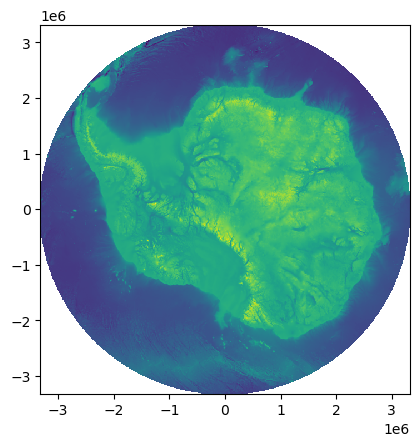

In [11]:
plt.pcolormesh(ds.x, ds.y, ds.bed.values)
plt.axis('scaled')
plt.show()

In [12]:
thick_cond = np.where(ds.mask == 4, 0, ds.thick_cond.values)

bed_cond = ds.surface.values - thick_cond
ice_rock_msk = (ds.mask == 1) | (ds.mask == 4) | (ds.mask == 2)
bed_cond = np.where(ice_rock_msk, bed_cond, np.nan)
xx, yy = np.meshgrid(ds.x, ds.y)

cond_msk = ~np.isnan(bed_cond)
x_cond = xx[cond_msk]
y_cond = yy[cond_msk]
data_cond = bed_cond[cond_msk]
trend = ds.trend.values

res_cond = bed_cond - trend

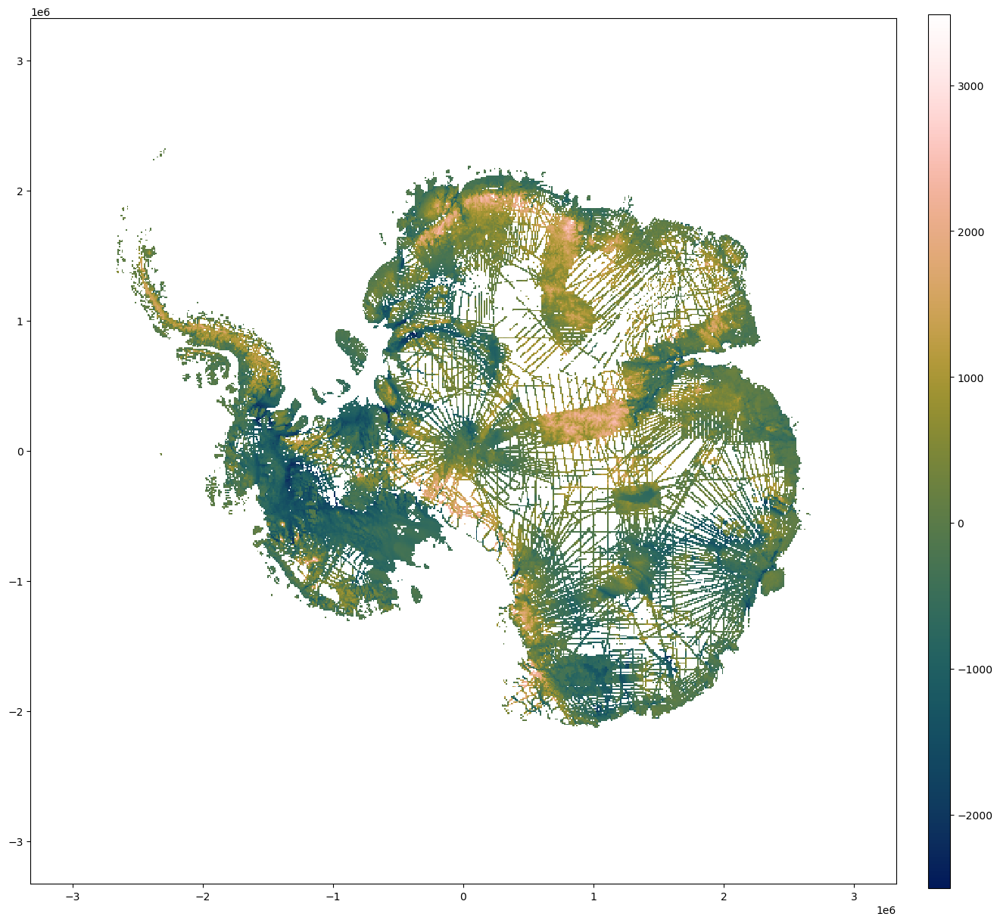

In [13]:
plt.figure(figsize=(18,15))
plt.pcolormesh(ds.x, ds.y, bed_cond, cmap=cm.batlowW)
plt.axis('scaled')
plt.colorbar(pad=0.03, aspect=40)
plt.show()

In [14]:
def spline_interp_msk(points, values, xx, yy, mask, damping):
    sp = vd.Spline(damping=damping)
    sp.fit((points[:,0], points[:,1]), values)
    preds = sp.predict((xx[mask], yy[mask]))
    grid = np.full(xx.shape, np.nan)
    np.place(grid, mask, preds)
    return grid

In [15]:
cond_coords = np.array([x_cond[::1000], y_cond[::1000]]).T
trend = spline_interp_msk(cond_coords, data_cond[::1000], xx, yy, ice_rock_msk, damping=1e-5)

res_cond = bed_cond - trend

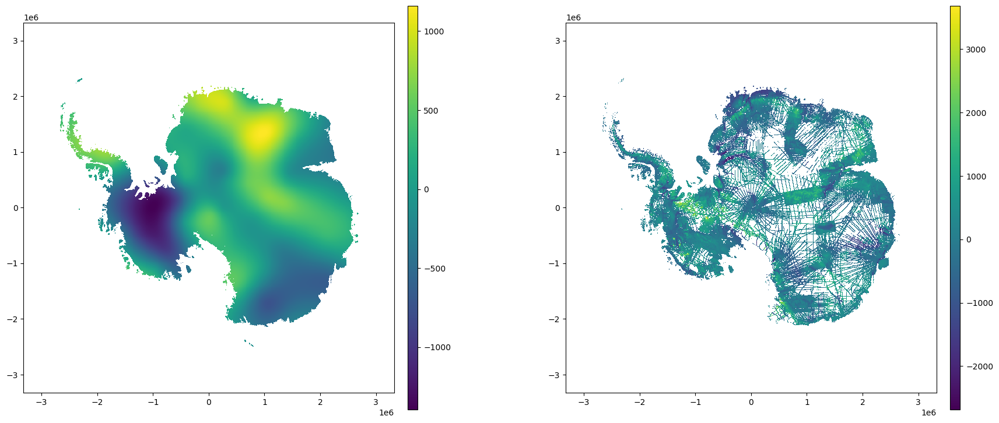

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(22,9))
ax = axs[0]
im = ax.pcolormesh(ds.x, ds.y, trend)
ax.axis('scaled')
plt.colorbar(im, pad=0.03, aspect=40)

ax = axs[1]
im = ax.pcolormesh(ds.x, ds.y, res_cond)
ax.axis('scaled')
plt.colorbar(im, pad=0.03, aspect=40)
plt.show()

# IBCSO

In [17]:
bath = xr.open_dataset(Path('D:/IBCSO_v2_allfiles/IBCSO_v2_bed.nc'))
bath = bath.coarsen(x=20, y=20, boundary='trim').median()
bath

<xarray.Dataset> Size: 4MB
Dimensions:              (y: 960, x: 960)
Coordinates:
  * x                    (x) float64 8kB -4.795e+06 -4.785e+06 ... 4.795e+06
  * y                    (y) float64 8kB -4.795e+06 -4.785e+06 ... 4.795e+06
Data variables:
    polar_stereographic  |S1 1B b''
    z                    (y, x) float32 4MB nan nan nan nan ... nan nan nan nan
Attributes:
    Conventions:      CF-1.5
    title:            International Bathymetric Chart of the Southern Ocean (...
    institution:      Alfred Wegener Institute Helmholtz Centre for Polar and...
    contact:          Dr. Boris Dorschel, IBCSO@awi.de,southern-ocean@seabed2...
    comment:          The International Bathymetric Chart of the Southern Oce...
    doi:              https://doi.pangaea.de/10.1594/PANGAEA.937574
    webpage:          www.ibcso.org
    IBCSO_version:    2.0
    doi_publication:  https://doi.org/10.1038/s41597-022-01366-7

In [18]:
bath.x.values[1]-bath.x.values[0]

np.float64(10000.0)

In [19]:
tid = xr.open_dataset(Path('D:/IBCSO_v2_allfiles/IBCSO_v2_tid.nc'))
tid = tid.coarsen(x=20, y=20, boundary='trim').median()
tid

<xarray.Dataset> Size: 4MB
Dimensions:              (y: 960, x: 960)
Coordinates:
  * x                    (x) float64 8kB -4.795e+06 -4.785e+06 ... 4.795e+06
  * y                    (y) float64 8kB -4.795e+06 -4.785e+06 ... 4.795e+06
Data variables:
    polar_stereographic  |S1 1B b''
    tid                  (y, x) float32 4MB 40.0 40.0 40.0 ... 40.0 40.0 40.0
Attributes:
    Conventions:      CF-1.5
    title:            International Bathymetric Chart of the Southern Ocean (...
    institution:      Alfred Wegener Institute Helmholtz Centre for Polar and...
    contact:          Dr. Boris Dorschel, IBCSO@awi.de,southern-ocean@seabed2...
    comment:          The International Bathymetric Chart of the Southern Oce...
    doi:              https://doi.pangaea.de/10.1594/PANGAEA.937574
    webpage:          www.ibcso.org
    IBCSO_version:    2.0
    doi_publication:  https://doi.org/10.1038/s41597-022-01366-7

In [20]:
bath.polar_stereographic

<xarray.DataArray 'polar_stereographic' ()> Size: 1B
array(b'', dtype='|S1')
Attributes:
    grid_mapping_name:                      polar_stereographic
    straight_vertical_longitude_from_pole:  0.0
    false_easting:                          0.0
    false_northing:                         0.0
    latitude_of_projection_origin:          -90.0
    standard_parallel:                      -65.0
    long_name:                              CRS definition
    longitude_of_prime_meridian:            0.0
    semi_major_axis:                        6378137.0
    inverse_flattening:                     298.257223563
    spatial_ref:                            PROJCS["WGS 84 / IBCSO Polar Ster...
    GeoTransform:                           -4800000 500 0 4800000 0 -500

In [21]:
from pyproj import Transformer, CRS

In [22]:
CRS(3031)

<Projected CRS: EPSG:3031>
Name: WGS 84 / Antarctic Polar Stereographic
Axis Info [cartesian]:
- E[north]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Antarctica.
- bounds: (-180.0, -90.0, 180.0, -60.0)
Coordinate Operation:
- name: Antarctic Polar Stereographic
- method: Polar Stereographic (variant B)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
CRS(9354)

<Projected CRS: EPSG:9354>
Name: WGS 84 / IBCSO Polar Stereographic
Axis Info [cartesian]:
- X[north]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Southern hemisphere - south of 50°S onshore and offshore, including Antarctica.
- bounds: (-180.0, -90.0, 180.0, -50.0)
Coordinate Operation:
- name: IBCSO Polar Stereographic
- method: Polar Stereographic (variant B)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [24]:
xx_ibcso, yy_ibcso = np.meshgrid(bath.x, bath.y)

transformer = Transformer.from_crs(9354, 3031)
xx_ps, yy_ps = transformer.transform(xx_ibcso, yy_ibcso)

ibcso_coords = np.array([xx_ps.flatten(), yy_ps.flatten()]).T

preds_bath = griddata(ibcso_coords, bath.z.values.flatten(), pred_coords)
preds_tid = griddata(ibcso_coords, tid.tid.values.flatten(), pred_coords)

preds_bath = preds_bath.reshape(xx.shape)
preds_tid = preds_tid.reshape(xx.shape)

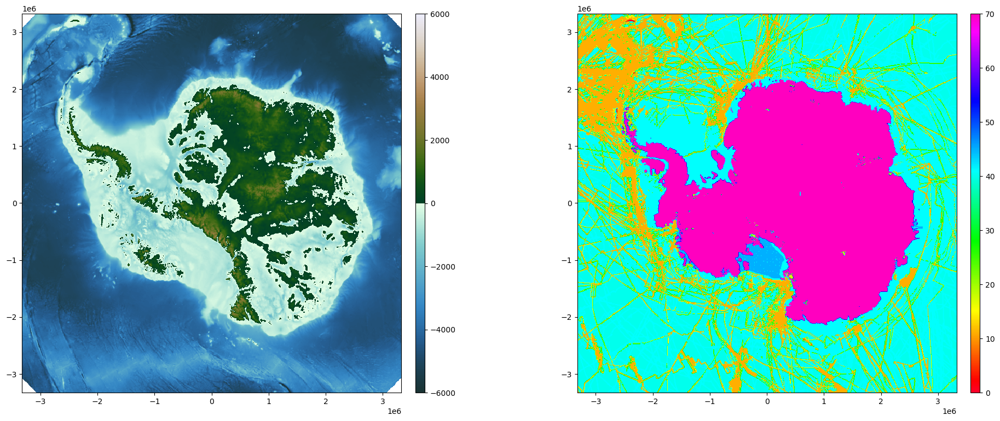

In [25]:
fig, axs = plt.subplots(1, 2, figsize=(24,9))
ax = axs[0]
im = ax.pcolormesh(ds.x, ds.y, preds_bath, cmap=cm.bukavu, vmin=-6000, vmax=6000)
ax.axis('scaled')
plt.colorbar(im, pad=0.03, aspect=40)

ax = axs[1]
im = ax.pcolormesh(ds.x, ds.y, preds_tid, cmap='gist_rainbow')
ax.axis('scaled')
plt.colorbar(im, pad=0.03, aspect=40)
plt.show()

# TID meaning

https://www.nature.com/articles/s41597-022-01366-7/tables/2

* 10 - singlebeam
* 11 - multibeam
* 12 - seismic
* 13 - isolated sounding
* 46 - draft of a grounded iceberg

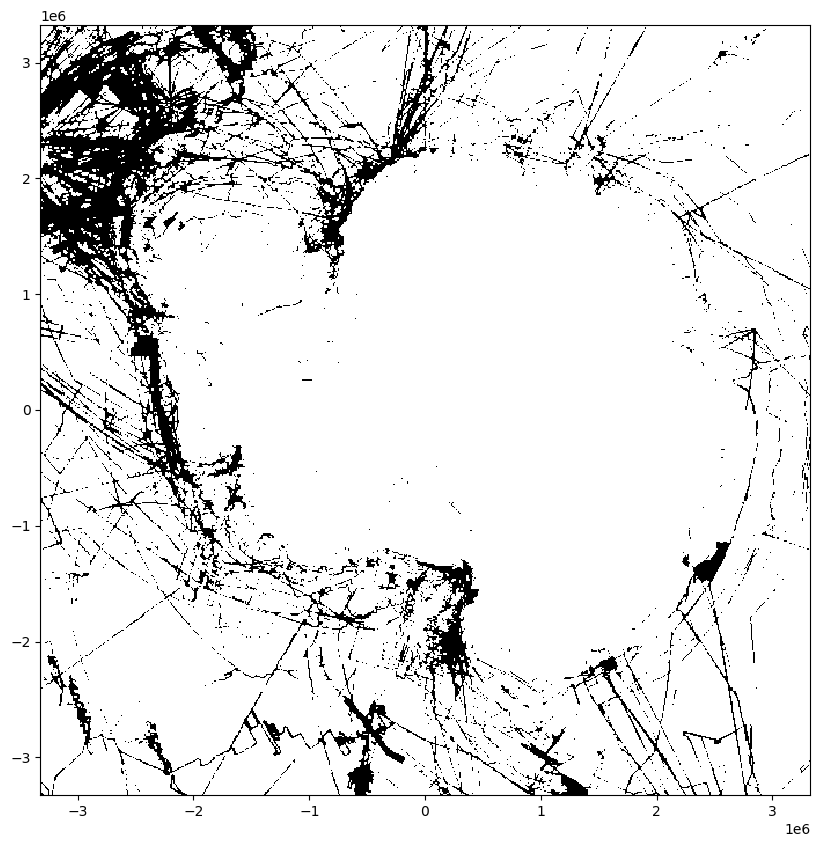

In [26]:
preds_tid = np.rint(preds_tid).astype(int)
ocean_msk = (preds_tid==10) | (preds_tid==11) | (preds_tid==12) | (preds_tid==13) | (preds_tid==46)

plt.figure(figsize=(12,10))
plt.pcolormesh(ds.x, ds.y, ocean_msk, cmap='binary')
plt.axis('scaled')
plt.show()

In [27]:
ocean_cond = np.where(ocean_msk, preds_bath, np.nan)
combined_cond = np.where(ocean_msk, preds_bath, np.nan)
combined_cond = np.where(cond_msk, bed_cond, combined_cond)
combined_mask = ~np.isnan(combined_cond)

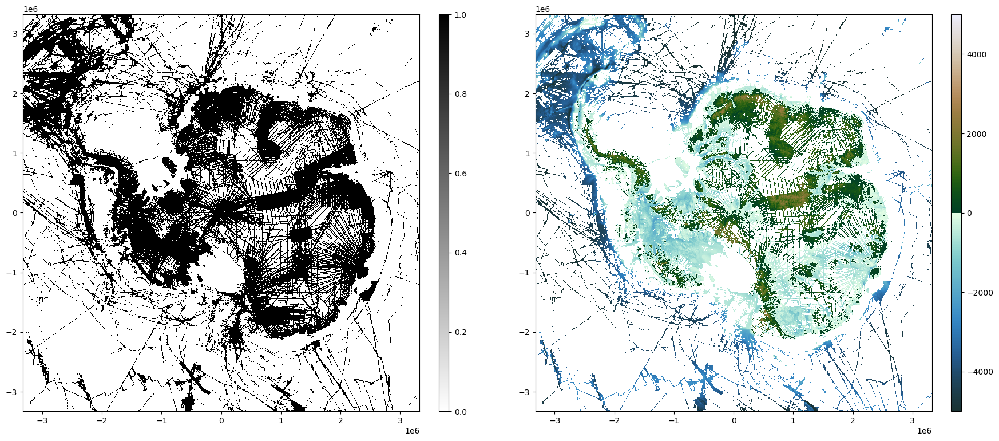

In [28]:
fig, axs = plt.subplots(1, 2, figsize=(26,9), gridspec_kw=dict(wspace=-0.2))
ax = axs[0]
im = ax.pcolormesh(ds.x, ds.y, combined_mask, cmap='binary')
ax.axis('scaled')
plt.colorbar(im, pad=0.03, aspect=40)

ax = axs[1]
im = ax.pcolormesh(ds.x, ds.y, combined_cond, cmap=cm.bukavu, vmin=-5000, vmax=5000)
ax.axis('scaled')
plt.colorbar(im, pad=0.03, aspect=40)
plt.show()

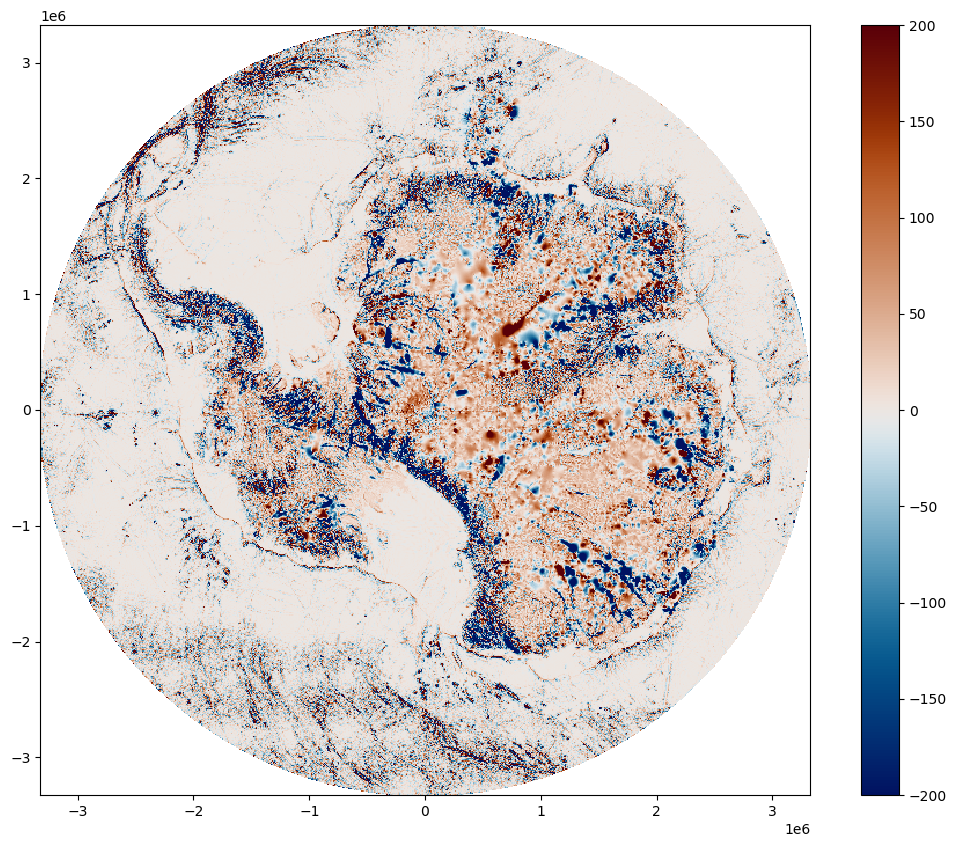

In [29]:
plt.figure(figsize=(13,10))
plt.pcolormesh(ds.x, ds.y, ds.bed - preds_bath, cmap=cm.vik, vmin=-200, vmax=200)
plt.axis('scaled')
plt.colorbar()
plt.show()

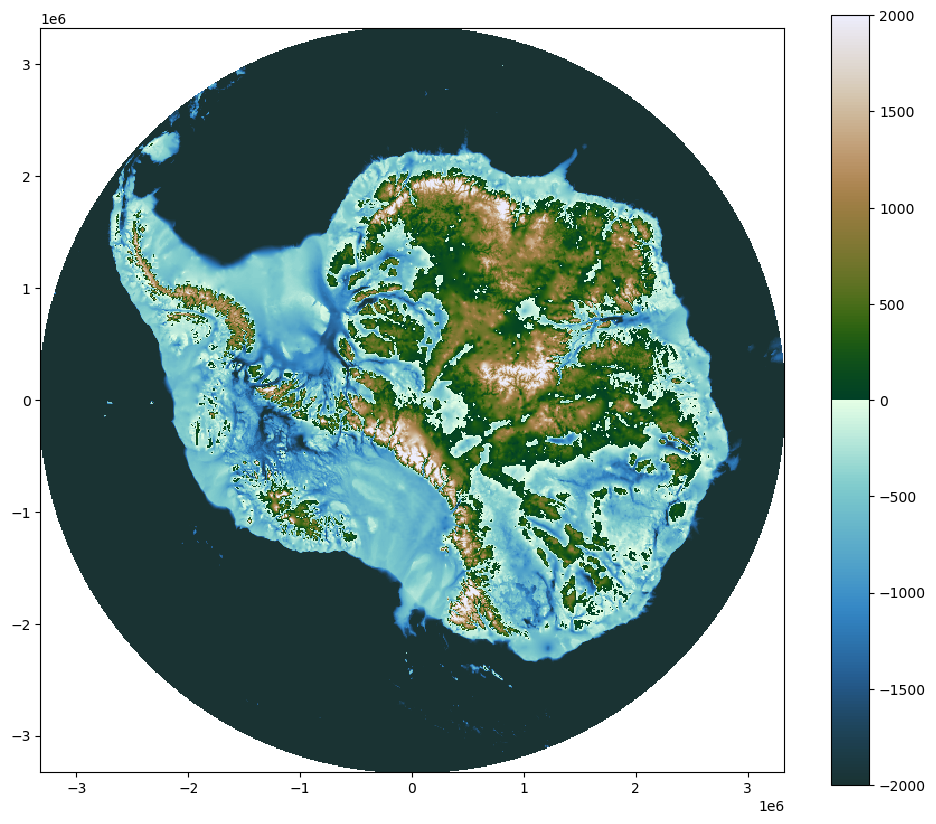

In [30]:
plt.figure(figsize=(12,10))
plt.pcolormesh(ds.x, ds.y, ds.bed, cmap=cm.bukavu, vmin=-2000, vmax=2000)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [31]:
xx, yy = np.meshgrid(ds.x, ds.y)

sim_mask = (ds.bed.values > -2000) | (ds.mask.values==1) | (ds.mask.values==3)
sim_mask_pad = vd.distance_mask((xx[sim_mask==True], yy[sim_mask==True]), maxdist=100e3, coordinates=(xx, yy)) & ~np.isnan(grav_dist)

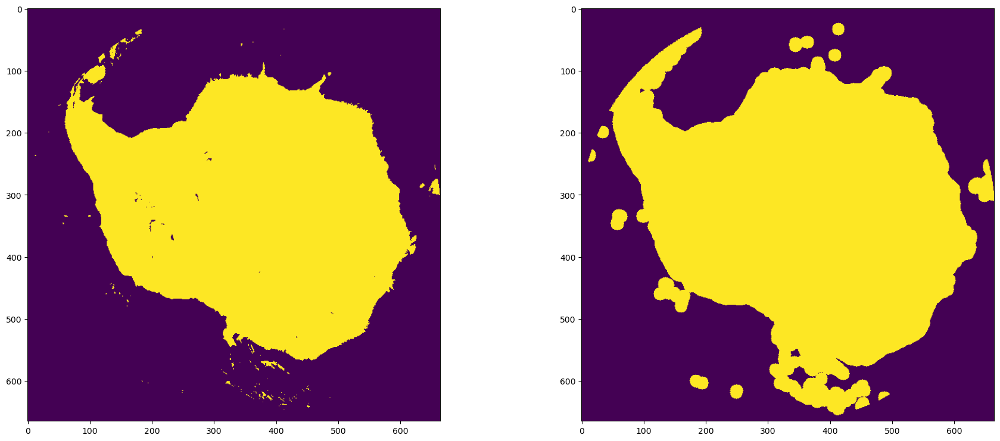

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(22,9))
ax = axs[0]
ax.imshow(sim_mask)
ax = axs[1]
ax.imshow(sim_mask_pad)

plt.show()

In [33]:
bm = xr.open_dataset(Path('D:/bedmachine/BedMachineAntarctica-v3.nc'))
bm = bm.coarsen(x=20, y=20, boundary='trim').median()
bm['mask'] = (('y', 'x'), np.where(np.isnan(bm.mask.values), np.nan, np.rint(bm.mask.values).astype(int)))

In [34]:
xx_bm, yy_bm = np.meshgrid(bm.x, bm.y)
    
bm_coords = np.array([xx_bm.flatten(), yy_bm.flatten()]).T
pred_coords = np.array([xx.flatten(), yy.flatten()]).T

bm_mask = griddata(bm_coords, bm.mask.values.flatten(), pred_coords)
bm_mask = bm_mask.reshape(xx.shape)

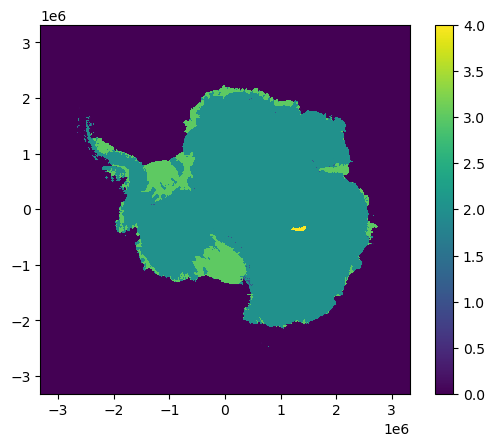

In [35]:
plt.pcolormesh(ds.x, ds.y, bm_mask)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [36]:
bed = np.where(ds.mask.values==0, preds_bath, ds.bed.values)
bed = np.where((cond_msk==True) & (bm_mask!=4), bed_cond, bed)

In [37]:
ds['bed'] = (('y', 'x'), bed)

# make sure surface is 0 in open water
ds['surface'] = (('y', 'x'), np.where(ds.mask==0, 0, ds.surface))

# make sure thickness is 0 in open water and at exposed rock
ocean_rock_msk = (ds.mask==0) | (ds.mask==1)
ds['thickness'] = (('y', 'x'), np.where(ocean_rock_msk, 0, ds.thickness))

# make sure bed is equal to surface minus thickness under grounded ice
ds['bed'] = (('y', 'x'), np.where(ds.mask==2, ds.surface-ds.thickness, ds.bed))

# make sure surface is equal to bed at exposed rock
ds['bed'] = (('y', 'x'), np.where(ds.mask==1, ds.surface, ds.bed))

# make sure bed not above ice in ice shelf
bed_above_ice_bottom = np.where(ds.bed > (ds.surface-ds.thickness), True, False)
ds['bed'] = (('y', 'x'), np.where(bed_above_ice_bottom, ds.surface-ds.thickness, ds.bed))

# make mask grounded ice where bed was above ice bottom
ds['mask'] = (('y', 'x'), np.where(bed_above_ice_bottom, 2, ds.mask))

# reference elevations to WGS84
ds['bed'] += ds['geoid']
ds['surface'] += ds['geoid']

# Gravity initial forward model

In [38]:
from numba import njit, prange
from choclo.prism import gravity_u

@njit(parallel=True)
def local_gravity_jit(xx, yy, zz, surf, thick, bed, mask, distance, domain_mask, progress_proxy=None):
    g_z = np.empty(xx.shape)
    ni, nj = xx.shape
    res = np.abs(xx[0,1] - xx[0,0])
    hw = distance//res
    
    for i in prange(ni):
        for j in range(nj):
            if domain_mask[i,j]==False:
                g_z[i,j] = np.nan
            else:
                ilow = max(0, i-hw)
                ihigh = min(ni, i+hw+1)
                jlow = max(0, j-hw)
                jhigh = min(nj, j+hw+1)

                xx_trim = xx[ilow:ihigh,jlow:jhigh]
                yy_trim = yy[ilow:ihigh,jlow:jhigh]
                mask_trim = mask[ilow:ihigh,jlow:jhigh]
                surf_trim = surf[ilow:ihigh,jlow:jhigh]
                thick_trim = thick[ilow:ihigh,jlow:jhigh]
                bed_trim = bed[ilow:ihigh,jlow:jhigh]

                prisms, density = make_prisms_jit(xx_trim, yy_trim, surf_trim, thick_trim, bed_trim, mask_trim)
                
                for m in range(prisms.shape[0]):
                    g_z[i,j] += gravity_u(
                        xx[i,j],
                        yy[i,j],
                        zz[i,j],
                        prisms[m, 0],
                        prisms[m, 1],
                        prisms[m, 2],
                        prisms[m, 3],
                        prisms[m, 4],
                        prisms[m, 5],
                        density[m],
                    )
            if progress_proxy is not None:
                progress_proxy.update(1)
    g_z *= -1*1e5
    return g_z

@njit()
def layer_prisms_jit(xx, yy, bottom, top, msk, half_res):
    prisms = np.empty((xx.flatten().size, 6))
    prisms[:,0] = xx.flatten()-half_res
    prisms[:,1] = xx.flatten()+half_res
    prisms[:,2] = yy.flatten()-half_res
    prisms[:,3] = yy.flatten()+half_res
    prisms[:,4] = bottom.flatten()
    prisms[:,5] = top.flatten()
    prisms = prisms[msk.flatten(),:]

    return prisms

@njit()
def split_prisms_jit(prisms):
    prisms_pos = prisms[prisms[:,5] >= 0, :]
    prisms_neg = prisms[prisms[:,4] < 0, :]
    prisms_pos[prisms_pos[:,4] < 0, 4] = 0.0
    prisms_neg[prisms_neg[:,5] > 0, 5] = 0.0
    prisms = np.vstack((prisms_pos, prisms_neg))
    idx_pos = np.full(prisms.shape[0], False)
    idx_pos[:prisms_pos.shape[0]] = True
    return prisms, idx_pos

@njit()
def make_prisms_jit(xx, yy, surf, thick, bed, mask):
    ice_dens = float(917)
    water_dens = float(1027)
    rock_dens = float(2670)
    
    res = np.abs(xx[0,1] - xx[0,0])
    half_res = res/2

    # calculate water column thickness
    water_thickness = surf - thick - bed

    # water prisms
    water_msk = (mask==0) | (mask==3)
    prisms_water = layer_prisms_jit(xx, yy, bed, bed+water_thickness, water_msk, half_res)
    prisms_water, idx_water_pos = split_prisms_jit(prisms_water)
    d_water = np.where(idx_water_pos, water_dens, water_dens-rock_dens)

    # ice prisms
    ice_msk = (mask==3) | (mask==2)
    prisms_ice = layer_prisms_jit(xx, yy, surf-thick, surf, ice_msk, half_res)
    prisms_ice, idx_ice_pos = split_prisms_jit(prisms_ice)
    d_ice = np.where(idx_ice_pos, ice_dens, ice_dens-rock_dens)
    
    # positive rock
    rock_msk = bed > 0
    prisms_rock = layer_prisms_jit(xx, yy, np.zeros_like(xx), bed, rock_msk, half_res)
    d_rock = np.full(prisms_rock.shape[0], rock_dens)
    
    # negative rock
    negrock_msk = surf < 0
    prisms_negrock = layer_prisms_jit(xx, yy, surf, np.zeros_like(xx), negrock_msk, half_res)
    d_negrock = np.full(prisms_negrock.shape[0], -rock_dens)

    # collect all prisms and densities
    prisms = np.vstack((prisms_ice, prisms_water, prisms_rock, prisms_negrock))
    densities = np.concatenate((d_ice, d_water, d_rock, d_negrock))

    # remove bad prisms where bottom is above top
    bad_idx = prisms[:,4] > prisms[:,5]
    prisms = prisms[bad_idx==False,:]
    densitites = densities[bad_idx==False]

    return prisms, densities


In [39]:
ds = ds.assign_attrs({'res' : 10000})

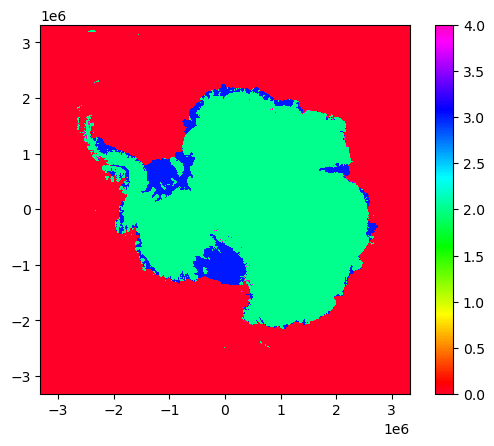

In [40]:
plt.pcolormesh(ds.x, ds.y, ds.mask, cmap='gist_rainbow')
plt.axis('scaled')
plt.colorbar()
plt.show()

In [41]:
from numba_progress import ProgressBar

In [42]:
%%time

zz = np.full_like(xx, 5000)

with ProgressBar(total=xx.flatten().size) as progress:
    g_z = local_gravity_jit(xx, yy, zz, ds.surface.values, ds.thickness.values, ds.bed.values, ds.mask.values, 500e3, ~np.isnan(ds.bed.values), progress)

  0%|          | 0/442225 [00:00<?, ?it/s]

CPU times: total: 2h 10min 26s
Wall time: 9min 18s


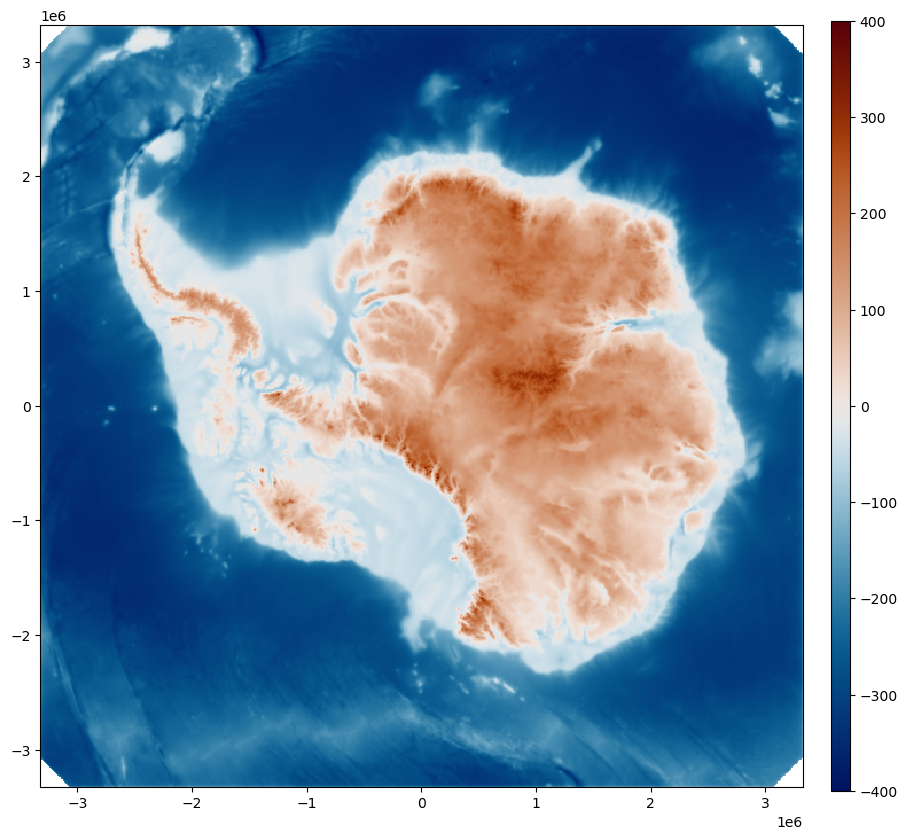

In [43]:
plt.figure(figsize=(12,10))
plt.pcolormesh(ds.x, ds.y, g_z, cmap=cm.vik, vmin=-400, vmax=400)
plt.axis('scaled')
plt.colorbar(pad=0.03, aspect=40)
plt.show()

In [44]:
boug = grav_dist - g_z

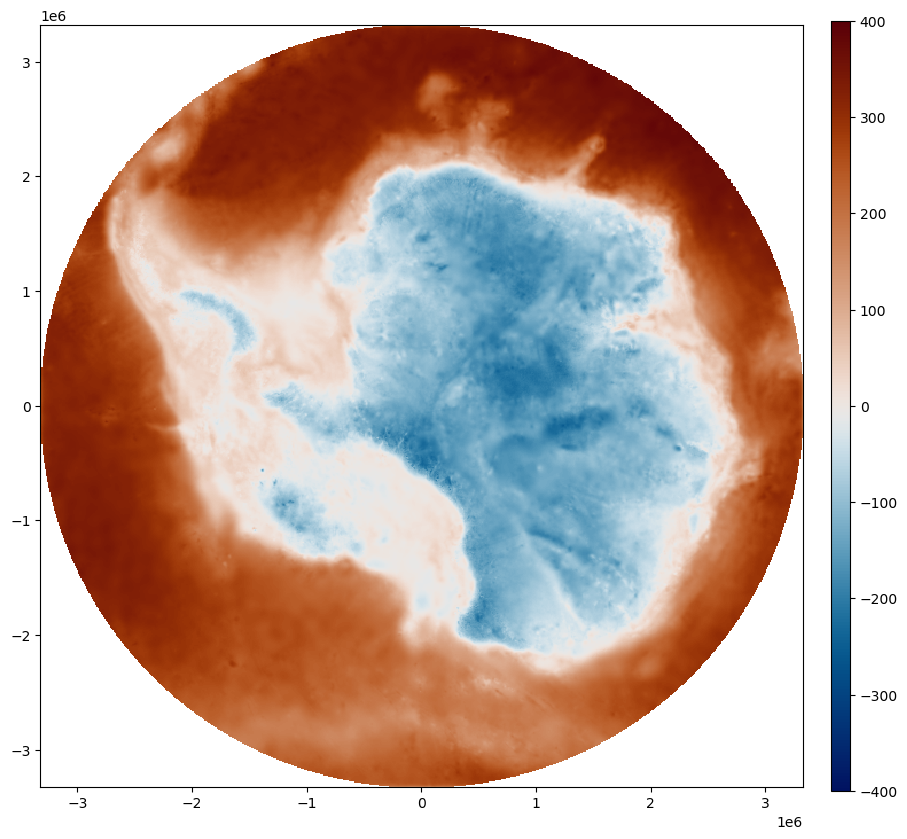

In [45]:
plt.figure(figsize=(12,10))
plt.pcolormesh(ds.x, ds.y, boug, cmap=cm.vik, vmin=-400, vmax=400)
plt.axis('scaled')
plt.colorbar(pad=0.03, aspect=40)
plt.show()

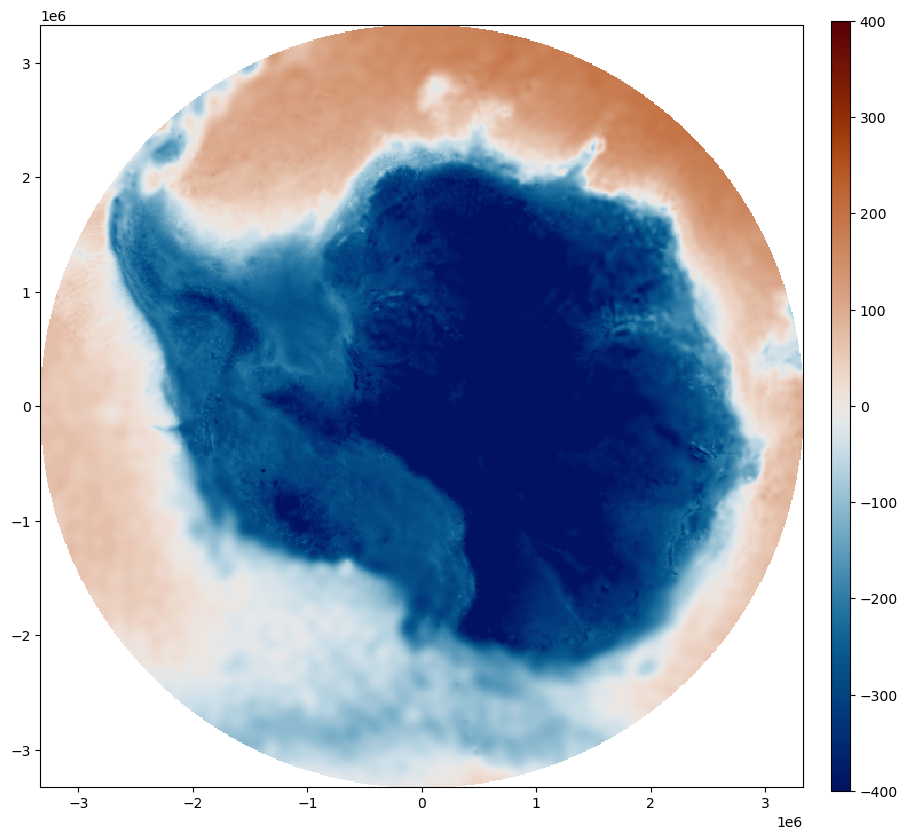

In [46]:
plt.figure(figsize=(12,10))
plt.pcolormesh(antgg.x, antgg.y, antgg.Boug_anom, cmap=cm.vik, vmin=-400, vmax=400)
plt.axis('scaled')
plt.colorbar(pad=0.03, aspect=40)
plt.show()

In [47]:
boug_cond = np.where(combined_mask, boug, np.nan)

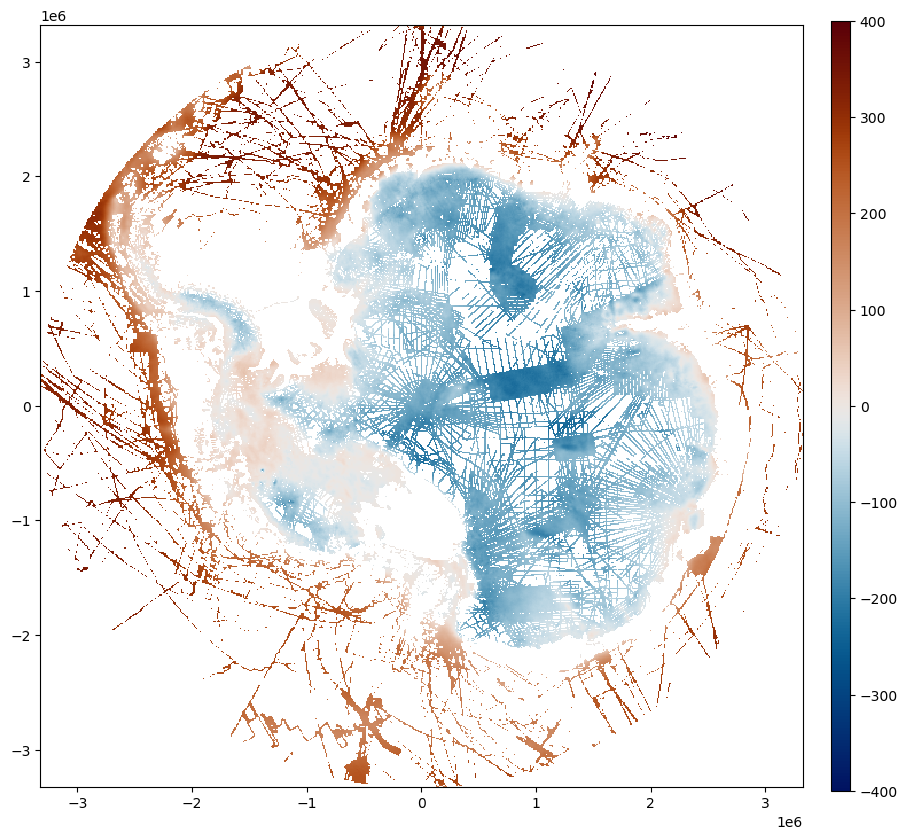

In [48]:
plt.figure(figsize=(12,10))
plt.pcolormesh(ds.x, ds.y, boug_cond, cmap=cm.vik, vmin=-400, vmax=400)
plt.axis('scaled')
plt.colorbar(pad=0.03, aspect=40)
plt.show()

In [49]:
interp_msk = ~np.isnan(boug_cond)

x_cond = xx[interp_msk]
y_cond = yy[interp_msk]
boug_values = boug_cond[interp_msk]

grav_mask = np.where(grav_dist, True, False)

cond_coords = np.array([x_cond[::1000], y_cond[::1000]]).T
boug_trend = spline_interp_msk(cond_coords, boug_values[::1000], xx, yy, grav_mask, damping=1e-7)
boug_residual = boug_cond - boug_trend

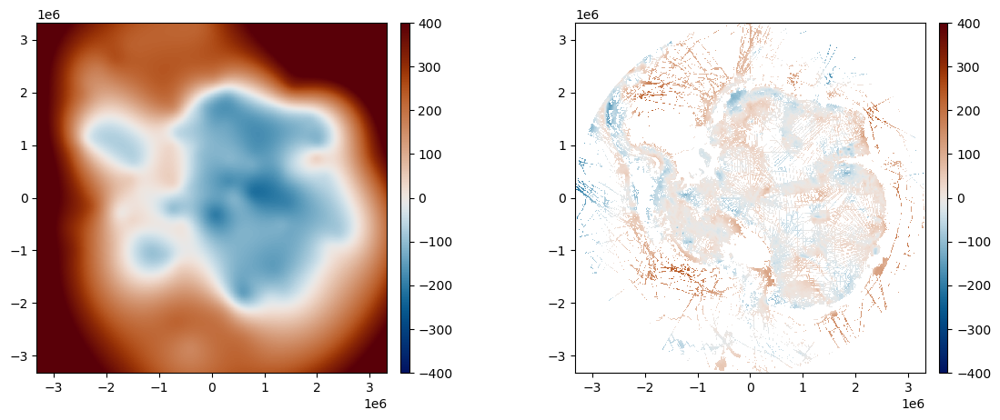

In [50]:
fig, axs = plt.subplots(1, 2, figsize=(14,5))
ax = axs[0]
im = ax.pcolormesh(ds.x, ds.y, boug_trend, vmin=-400, vmax=400, cmap=cm.vik)
ax.axis('scaled')
plt.colorbar(im, ax=ax, pad=0.03, aspect=40)

ax = axs[1]
im = ax.pcolormesh(ds.x, ds.y, boug_residual, vmin=-400, vmax=400, cmap=cm.vik)
ax.axis('scaled')
plt.colorbar(im, ax=ax, pad=0.03, aspect=40)
plt.show()

In [51]:
vgrams, experimental, bins = utilities.variograms(xx, yy, boug_residual, maxlag=750e3, n_lags=30, downsample=50)

In [52]:
# evaluate models
xi =np.linspace(0, bins[-1], 100) 

y_exp = models.exponential(xi, *vgrams['exponential'])
y_gauss = models.gaussian(xi, *vgrams['gaussian'])
y_sph = models.spherical(xi, *vgrams['spherical'])
y_matern = models.matern(xi, *vgrams['matern'])

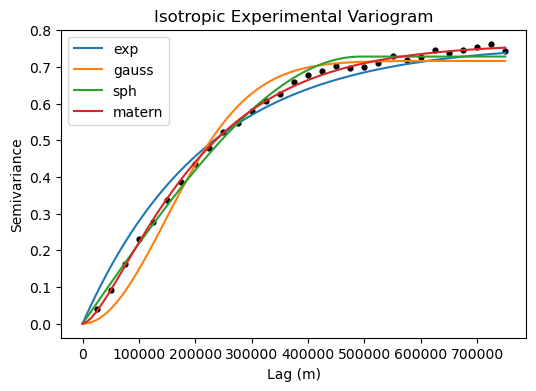

In [53]:
plt.figure(figsize=(6,4))
plt.scatter(bins, experimental, s=12, c='k')
plt.plot(xi, y_exp, label='exp')
plt.plot(xi, y_gauss, label='gauss')
plt.plot(xi, y_sph, label='sph')
plt.plot(xi, y_matern, label='matern')
plt.title('Isotropic Experimental Variogram')
plt.xlabel('Lag (m)'); plt.ylabel('Semivariance')
plt.legend()
plt.show()

In [54]:
vgrams['matern']

[np.float64(549116.1394350933),
 np.float64(0.7630366662727676),
 np.float64(0.9248357958750679),
 0]

In [55]:
bed_max = np.where(ds.mask==3, (ds.surface-ds.thickness).values, ds.bed.values)
bed_max = np.where(ds.mask!=3, ds.surface.values, bed_max)

density_dict = {
    'ice' : 917,
    'water' : 1027,
    'rock' : 2670
}
# pred_coords = (grav.x, grav.y, grav.height)

# prisms, densities = make_prisms(ds, bed_max, density_dict)
# g_z_max = hm.prism_gravity(pred_coords, prisms, densities, field='g_z', progressbar=True)

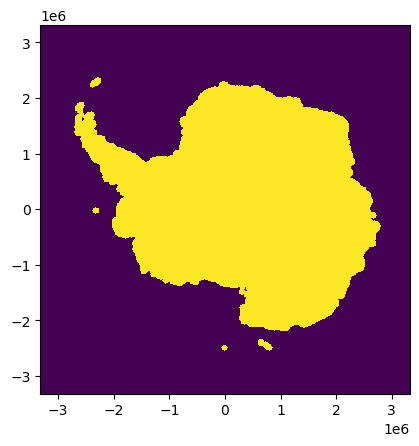

In [56]:
msk_bound = (ds.mask!=0)

x_bound = xx[msk_bound]
y_bound = yy[msk_bound]

bound_mask = vd.distance_mask((x_bound, y_bound), maxdist=50e3, coordinates=(xx, yy)) & ~np.isnan(grav_dist)

plt.pcolormesh(ds.x, ds.y, bound_mask)
plt.axis('scaled')
plt.show()

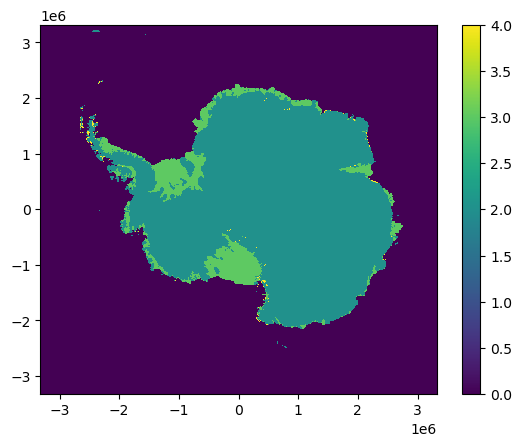

In [57]:
plt.pcolormesh(ds.x, ds.y, ds.mask)
plt.colorbar()
plt.show()

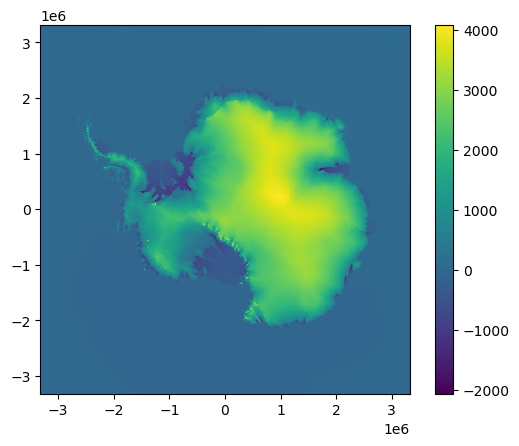

In [58]:
plt.pcolormesh(ds.x, ds.y, bed_max)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [59]:
with ProgressBar(total=xx.flatten().size) as progress:
    g_z_max = local_gravity_jit(xx, yy, zz, ds.surface.values, np.zeros_like(xx), bed_max, ds.mask.values, 500e3, ~np.isnan(ds.bed.values), progress)

  0%|          | 0/442225 [00:00<?, ?it/s]

In [60]:
boug_max = grav_dist - g_z_max
#boug_max_grid = xy_into_grid(ds, (pred_coords[0], pred_coords[1]), boug_max)
min_bound = boug_max - boug_trend
#min_bound = np.where(np.isnan(min_bound), np.nanmin(boug_residual), min_bound)

bounds = (min_bound, np.nanmax(boug_residual))

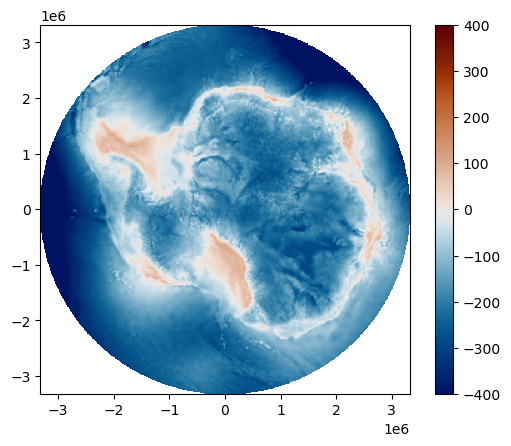

In [61]:
plt.pcolormesh(ds.x, ds.y, min_bound, vmin=-400, vmax=400, cmap=cm.vik)
plt.axis('scaled')
plt.colorbar()
plt.show()

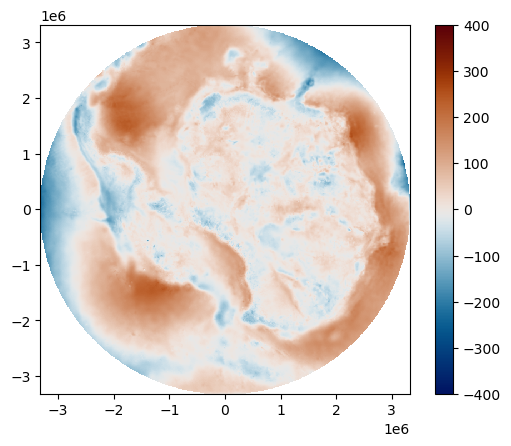

In [62]:
plt.pcolormesh(ds.x, ds.y, grav_dist-g_z-boug_trend, vmin=-400, vmax=400, cmap=cm.vik)
plt.axis('scaled')
plt.colorbar()
plt.show()

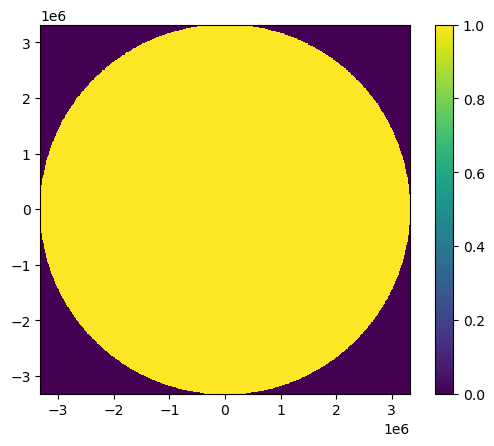

In [63]:
plt.pcolormesh(ds.x, ds.y, (grav_dist-g_z-boug_trend)>min_bound)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [64]:
np.allclose((grav_dist-g_z-boug_trend)>(boug_max-boug_trend), bound_mask)

False

In [65]:
# random number generator
rng = np.random.default_rng(seed=0)

k = 48
rad = 500_000

parameters = vgrams['matern']

vario = {
    'azimuth' : 0,
    'nugget' : parameters[-1],
    'major_range' : parameters[0],
    'minor_range' : parameters[0],
    'sill' : parameters[1],
    'vtype' : 'matern',
    's' : parameters[2]
}

sim_mask = ~np.isnan(grav_dist)

In [66]:
sim1 = interpolate.sgs(xx, yy, boug_residual, vario, rad, k, sim_mask=sim_mask, seed=rng, bounds=bounds)

  0%|          | 0/348303 [00:00<?, ?it/s]

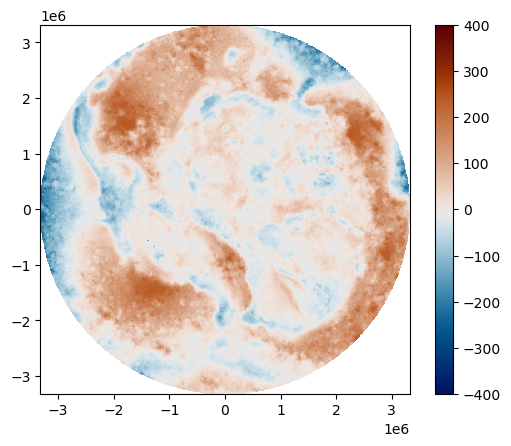

In [67]:
plt.pcolormesh(ds.x, ds.y, sim1, vmin=-400, vmax=400, cmap=cm.vik)
plt.axis('scaled')
plt.colorbar()
plt.show()

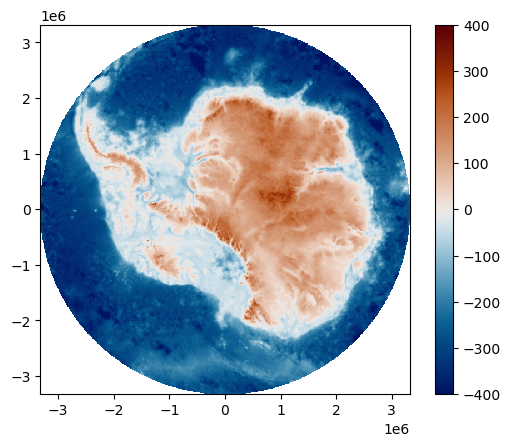

In [68]:
plt.pcolormesh(ds.x, ds.y, grav_dist-(sim1+boug_trend), vmin=-400, vmax=400, cmap=cm.vik)
plt.axis('scaled')
plt.colorbar()
plt.show()

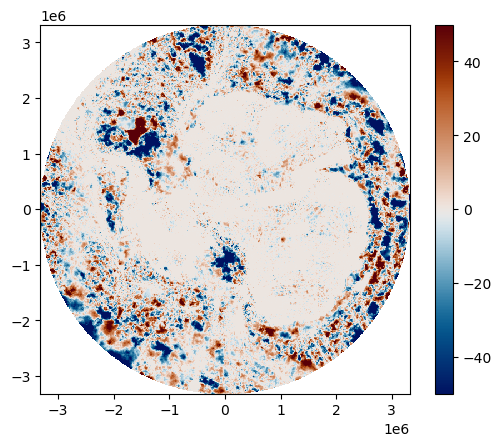

In [69]:
plt.pcolormesh(ds.x, ds.y, (boug-boug_trend)-sim1, vmin=-50, vmax=50, cmap=cm.vik)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [70]:
krig, std = interpolate.krige(xx, yy, boug_residual, vario, rad, k, sim_mask=sim_mask)

  0%|          | 0/348303 [00:00<?, ?it/s]

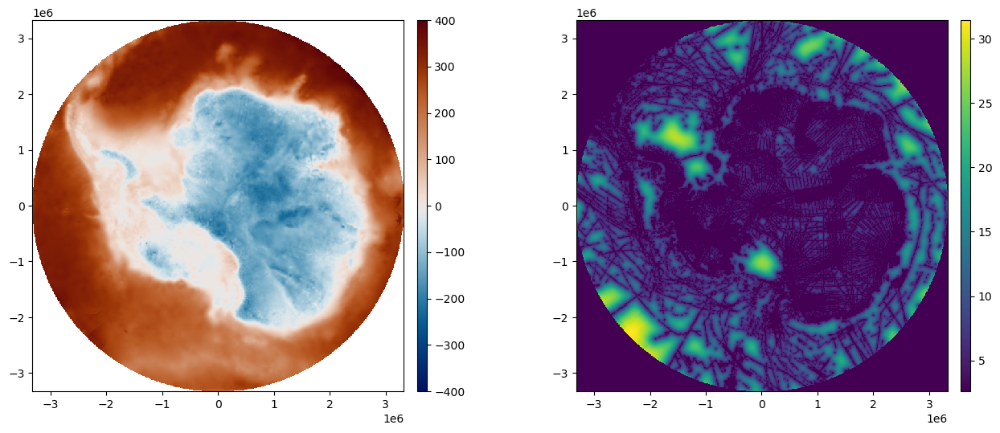

In [71]:
fig, axs = plt.subplots(1, 2, figsize=(16,6))
ax = axs[0]
im = ax.pcolormesh(ds.x, ds.y, krig+boug_trend, vmin=-400, vmax=400, cmap=cm.vik)
ax.axis('scaled')
plt.colorbar(im, ax=ax, pad=0.03, aspect=40)
ax = axs[1]
im = ax.pcolormesh(ds.x, ds.y, std)
ax.axis('scaled')
plt.colorbar(im, ax=ax, pad=0.03, aspect=40)
plt.show()

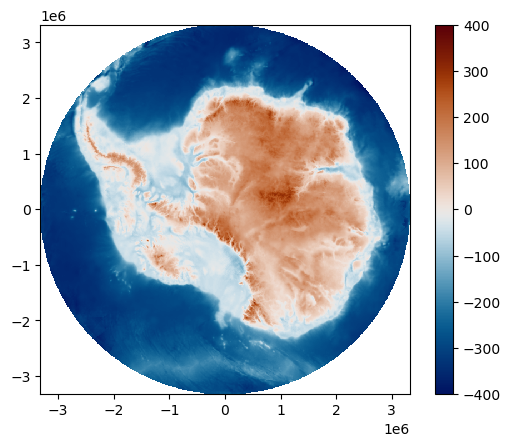

In [72]:
plt.pcolormesh(ds.x, ds.y, grav_dist-(krig+boug_trend), vmin=-400, vmax=400, cmap=cm.vik)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [73]:
mean_krige_terr = grav_dist-(krig+boug_trend)

In [104]:
from scipy.stats import linregress

nan_mask = np.isnan(mean_krige_terr) | np.isnan(ds.bed.values)

inv_var = ds.bed.values[~nan_mask]
dep_var = mean_krige_terr[~nan_mask]

result = linregress(inv_var, dep_var)
print(f"R-squared: {result.rvalue**2:.6f}")

R-squared: 0.958107


In [105]:
x_tmp = np.linspace(-6000, 4000, 1000)
y_tmp = result.intercept + x_tmp*result.slope

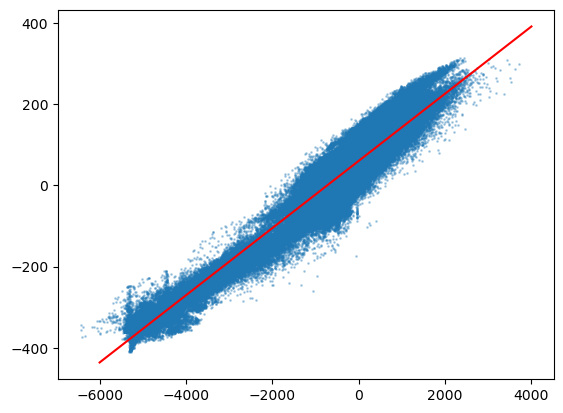

In [106]:
plt.scatter(ds.bed.values.flatten(), mean_krige_terr, s=1, alpha=0.3)
plt.plot(x_tmp, y_tmp, 'r-')
plt.show()

In [107]:
grid_norm, nst_trans = utilities.gaussian_transformation(ds.bed.values, ~nan_mask)
terr_dist_norm, nst_terr = utilities.gaussian_transformation(mean_krige_terr, ~nan_mask)

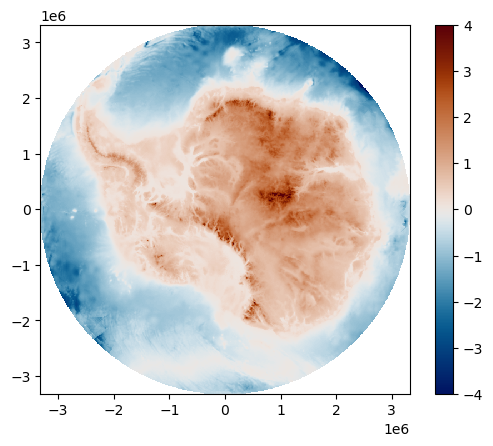

In [108]:
plt.pcolormesh(ds.x, ds.y, terr_dist_norm, vmin=-4, vmax=4, cmap=cm.vik)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [114]:
from scipy.stats import linregress

nan_mask = np.isnan(mean_krige_terr) | np.isnan(ds.bed.values)

inv_var = grid_norm[~nan_mask]
dep_var = terr_dist_norm[~nan_mask]

result = linregress(inv_var, dep_var)
print(f"R-squared: {result.rvalue**2:.6f}")

R-squared: 0.928071


In [115]:
x_tmp = np.linspace(-4, 4, 1000)
y_tmp = result.intercept + x_tmp*result.slope

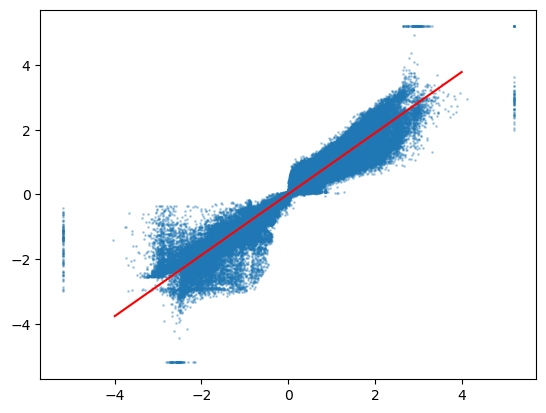

In [116]:
plt.scatter(grid_norm.flatten(), terr_dist_norm.flatten(), s=1, alpha=0.3)
plt.plot(x_tmp, y_tmp, 'r-')
plt.show()

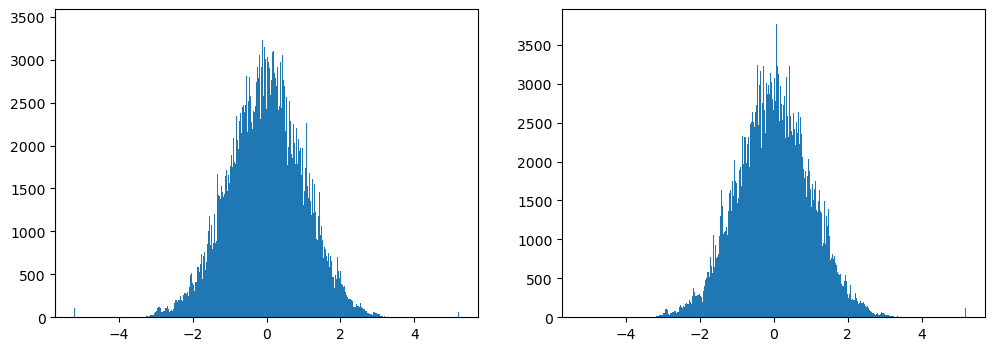

In [117]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
ax = axs[0]
ax.hist(grid_norm.flatten(), bins=500)
ax = axs[1]
ax.hist(terr_dist_norm.flatten(), bins=500)
plt.show()

In [118]:
corrcoef = np.corrcoef(ds.bed.values[~nan_mask], terr_dist_norm[~nan_mask])[0,1]
corrcoef

np.float64(0.9298647962226029)

In [119]:
vgrams, experimental, bins = utilities.variograms(xx, yy, combined_cond, maxlag=750e3, n_lags=30, downsample=50)

In [120]:
# evaluate models
xi =np.linspace(0, bins[-1], 100) 

y_exp = models.exponential(xi, *vgrams['exponential'])
y_gauss = models.gaussian(xi, *vgrams['gaussian'])
y_sph = models.spherical(xi, *vgrams['spherical'])
y_matern = models.matern(xi, *vgrams['matern'])

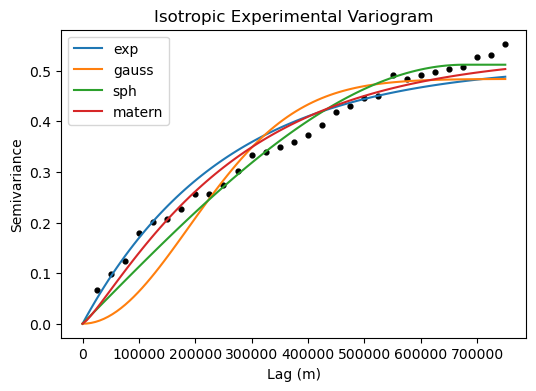

In [121]:
plt.figure(figsize=(6,4))
plt.scatter(bins, experimental, s=12, c='k')
plt.plot(xi, y_exp, label='exp')
plt.plot(xi, y_gauss, label='gauss')
plt.plot(xi, y_sph, label='sph')
plt.plot(xi, y_matern, label='matern')
plt.title('Isotropic Experimental Variogram')
plt.xlabel('Lag (m)'); plt.ylabel('Semivariance')
plt.legend()
plt.show()

In [54]:
vgrams['matern']

[np.float64(549116.1394350933),
 np.float64(0.7630366662727676),
 np.float64(0.9248357958750679),
 0]

In [122]:
terrain_bounds = (np.full_like(xx, np.min(combined_cond)), ds.surface.values)

In [208]:
from gstatsim_custom import interpolate, utilities, _krige
import prisms
import importlib
importlib.reload(interpolate)
importlib.reload(_krige)

<module 'gstatsim_custom._krige' from 'G:\\antarctic_iceshelves\\random\\../src\\gstatsim_custom\\_krige.py'>

In [209]:
co_sim1 = interpolate.cosim_mm1(xx, yy, combined_cond, terr_dist_norm, vario, corrcoef, rad, k, sim_mask=sim_mask, seed=rng, bounds=None)

  0%|          | 0/348303 [00:00<?, ?it/s]

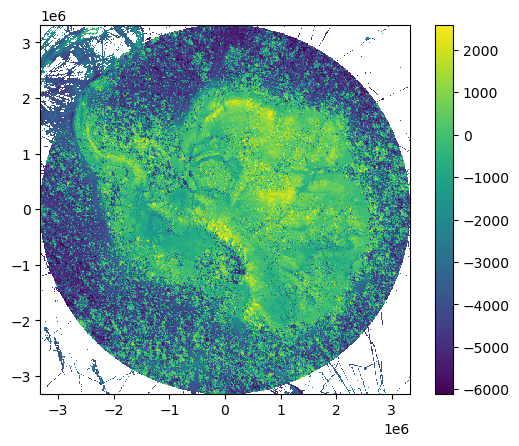

In [210]:
plt.pcolormesh(xx, yy, co_sim1)
plt.axis('scaled')
plt.colorbar()
plt.show()

In [193]:
np.sqrt(3469900.5932777547)

np.float64(1862.766918666357)

In [77]:
antgg

<xarray.Dataset> Size: 14MB
Dimensions:                    (y: 666, x: 666)
Coordinates:
  * y                          (y) float64 5kB 3.328e+06 ... -3.322e+06
  * x                          (x) float64 5kB -3.328e+06 ... 3.322e+06
Data variables:
    Boug_anom                  (y, x) float64 4MB nan nan nan ... nan nan nan
    grav_dist                  (y, x) float64 4MB nan nan nan ... nan nan nan
    gravity_disturbance_5000m  (y, x) float64 4MB nan nan nan ... nan nan nan
    std                        (y, x) float64 4MB nan nan nan ... nan nan nan

In [78]:
antggstd = xr.open_dataset(Path(r'D:\AntGG2021_allfiles\AntGG2021_Standard-deviation_GA-from-LSC.nc'))
antggstd

<xarray.Dataset> Size: 28MB
Dimensions:         (x: 1333, y: 1333, map_projection: 0)
Coordinates:
  * x               (x) float64 11kB -3.33e+06 -3.325e+06 ... 3.325e+06 3.33e+06
  * y               (y) float64 11kB -3.33e+06 -3.325e+06 ... 3.325e+06 3.33e+06
  * map_projection  (map_projection) |S1 0B 
Data variables:
    std_grav_anom   (x, y) float64 14MB ...
    h_ellips        (x, y) float64 14MB ...

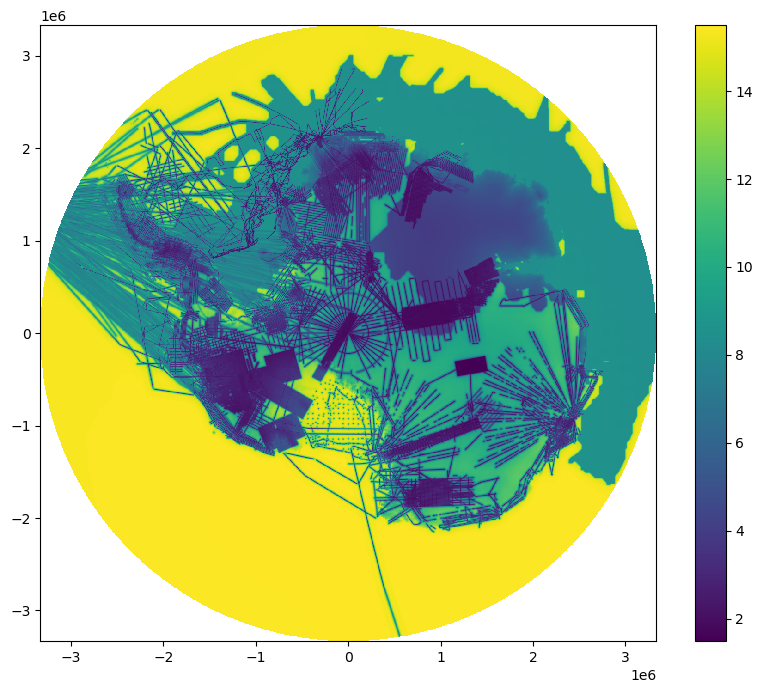

In [79]:
plt.figure(figsize=(10,8))
plt.pcolormesh(antggstd.x, antggstd.y, antggstd.std_grav_anom)
plt.axis('scaled')
plt.colorbar()
plt.show()